<a href="https://colab.research.google.com/github/yuxuan0702/Boston-Crime-/blob/master/boston-crime-visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# import packages 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import seaborn as sns 
import folium
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster


plt.style.use('ggplot')
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# import dataset 
df = pd.read_csv('/content/drive/My Drive/Website_notebook/boston_crime.csv')
df.head()

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (2,6,12) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,TESTTEST2,423,NaN,ASSAULT - AGGRAVATED,External,,0,2019-10-16 00:00:00,2019,10,Wednesday,0,NaN,RIVERVIEW DR,NaN,NaN,"(0.00000000, 0.00000000)"
1,I92102201,3301,NaN,VERBAL DISPUTE,E13,583,0,2019-12-20 03:08:00,2019,12,Friday,3,NaN,DAY ST,42.325122,-71.107779,"(42.32512200, -71.10777900)"
2,I92097173,3115,NaN,INVESTIGATE PERSON,C11,355,0,2019-10-23 00:00:00,2019,10,Wednesday,0,NaN,GIBSON ST,42.297555,-71.059709,"(42.29755500, -71.05970900)"
3,I92094519,3126,NaN,WARRANT ARREST - OUTSIDE OF BOSTON WARRANT,D14,765,0,2019-11-22 07:50:00,2019,11,Friday,7,NaN,BROOKS ST,42.355120,-71.162678,"(42.35512000, -71.16267800)"
4,I92089785,3005,NaN,SICK ASSIST,E13,574,0,2019-11-05 18:00:00,2019,11,Tuesday,18,NaN,WASHINGTON ST,42.309718,-71.104294,"(42.30971800, -71.10429400)"


In [3]:
# clean data 
df.drop(columns=['INCIDENT_NUMBER','SHOOTING'],inplace=True)
df = df[(df.YEAR!=2015) & (df.YEAR !=2020)]
df = df[df['DISTRICT']!='External']
df['OCCURRED_ON_DATE'] = pd.to_datetime(df['OCCURRED_ON_DATE'])
df['OCCURRED_ON_DATE']=df['OCCURRED_ON_DATE'].dt.date
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 398013 entries, 1 to 480712
Data columns (total 15 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   OFFENSE_CODE         398013 non-null  int64  
 1   OFFENSE_CODE_GROUP   373242 non-null  object 
 2   OFFENSE_DESCRIPTION  398013 non-null  object 
 3   DISTRICT             395842 non-null  object 
 4   REPORTING_AREA       398013 non-null  object 
 5   OCCURRED_ON_DATE     398013 non-null  object 
 6   YEAR                 398013 non-null  int64  
 7   MONTH                398013 non-null  int64  
 8   DAY_OF_WEEK          398013 non-null  object 
 9   HOUR                 398013 non-null  int64  
 10  UCR_PART             373134 non-null  object 
 11  STREET               384433 non-null  object 
 12  Lat                  372484 non-null  float64
 13  Long                 372484 non-null  float64
 14  Location             398013 non-null  object 
dtypes: float64(2), in

In [0]:
# change district code to district name 
df['DISTRICT'].replace('D14','Brighton',inplace=True)
df['DISTRICT'].replace('C11','Dorchester',inplace=True)
df['DISTRICT'].replace('D4','SouthEnd',inplace=True)
df['DISTRICT'].replace('B3','Mattapan',inplace=True)
df['DISTRICT'].replace('B2','Roxbury',inplace=True)
df['DISTRICT'].replace('C6','SouthBoston',inplace=True)
df['DISTRICT'].replace('A1','Downtown',inplace=True)
df['DISTRICT'].replace('E5','WestRoxbury',inplace=True)
df['DISTRICT'].replace('A7','EastBoston',inplace=True)
df['DISTRICT'].replace('E13','JamaicaPlain',inplace=True)
df['DISTRICT'].replace('E18','HydePark',inplace=True)
df['DISTRICT'].replace('A15','Charlestown',inplace=True)

# Time 

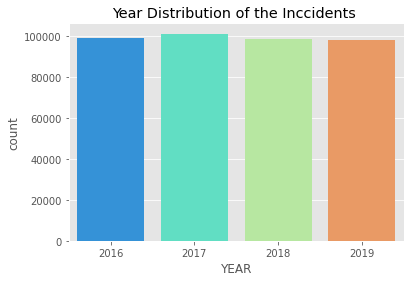

In [5]:
# year distribution 
sns.countplot(data = df, x = 'YEAR',palette='rainbow')
plt.title('Year Distribution of the Inccidents ')
plt.show()

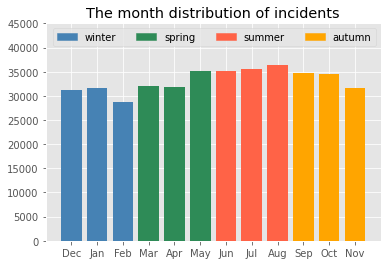

In [6]:
# month distribution data 
Month = ['Dec','Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov']
month_count = [31128,31549,28695,32093,31867,35098,35093,35483,36337,34665,34476,31529]
color = ['steelblue','steelblue','steelblue','seagreen','seagreen','seagreen','tomato','tomato','tomato','orange','orange','orange']

# month distribution plot 
fig, ax = plt.subplots()
ax.bar(Month,month_count,color=color)

#set title and y axis range 
plt.ylim(0,45000)
plt.title('The month distribution of incidents')

# set legend 
color = ['steelblue','seagreen','tomato','orange']
labels = ['winter', 'spring', 'summer', 'autumn']
patches = [ mpatches.Patch(color=color[i], label="{:s}".format(labels[i]) ) for i in range(len(color)) ] 
ax.legend(handles = patches, ncol = 4)
plt.show()

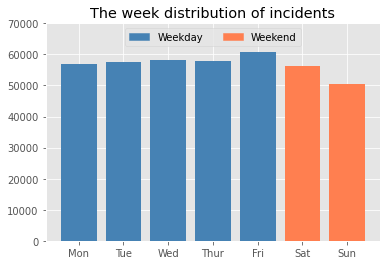

In [7]:
# Week data 
week = ['Mon','Tue','Wed','Thur','Fri','Sat','Sun']
number_of_incidents = [57019,57465,58310,57999,60745,56133,50395]

# Plot week distribution 
fig, ax = plt.subplots()
ax.bar(week,number_of_incidents,color=['steelblue','steelblue','steelblue','steelblue','steelblue','coral','coral'])

#set title and y axis range 
plt.title('The week distribution of incidents')
plt.ylim(0,70000)

# set legend 
color = ['steelblue','coral']
labels = ['Weekday', 'Weekend']
patches = [ mpatches.Patch(color=color[i], label="{:s}".format(labels[i]) ) for i in range(len(color)) ] 
ax.legend(handles = patches, ncol = 2,loc='upper center')
plt.show()

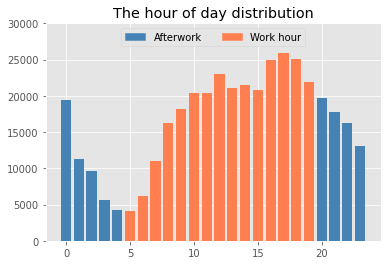

In [8]:
# hour data 
hour = df['HOUR'].value_counts()
hour = hour.sort_index()
color = ['steelblue','steelblue','steelblue','steelblue','steelblue','coral','coral','coral','coral','coral','coral','coral','coral','coral','coral','coral','coral','coral','coral','coral','steelblue','steelblue','steelblue','steelblue']

# hour distribution plot 
fig, ax = plt.subplots()
ax.bar(hour.index,hour,color = color,label = 'After Work Hour')

#set title and y axis range 
plt.title('The hour of day distribution')
plt.ylim(0,30000)

# set legend 
color = ['steelblue','coral']
labels = ['Afterwork', 'Work hour']
patches = [ mpatches.Patch(color=color[i], label="{:s}".format(labels[i]) ) for i in range(len(color)) ] 
ax.legend(handles = patches, ncol = 2,loc='upper center')
plt.show()

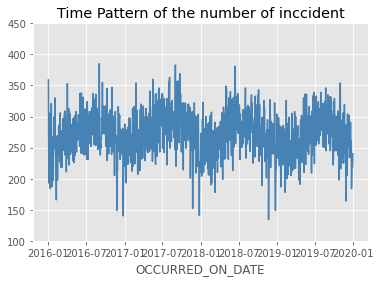

In [9]:
# Time plot 
df.groupby('OCCURRED_ON_DATE')[['OFFENSE_CODE']].count().plot(color='steelblue')

# decoration 
plt.ylim(100,450)
plt.legend().set_visible(False)
plt.title('Time Pattern of the number of inccident')
plt.show()

Time Pattern : 

- Clear Time Seasonality Pattern
- No clear Trend decreasing 
- **Hour** : More often during the work hour 
- **Week** : More often in Weekday than weekend 
- **Month** : Less in winter 


# Place 

In [0]:
# Slope Chart data
district_1619 = df.groupby(['DISTRICT','YEAR']).size().reset_index(name = 'count')
district_1619 = district_1619[(district_1619['YEAR'] == 2016) | (district_1619['YEAR'] == 2019)]
district_1619 = district_1619.pivot_table(index = 'DISTRICT',columns ='YEAR')
district_1619.columns = [2016,2019]

In [0]:
# using data in 2016 and 2019 
district_1619['previous_year']=2016
district_1619['last_year']=2019

In [0]:
# label 
left_label = [str(c) + ', '+ str(round(y)) for c, y in zip(district_1619.index, district_1619[2016])]
right_label = [str(c) + ', '+ str(round(y)) for c, y in zip(district_1619.index,district_1619[2019])]
klass = ['red' if (y1-y2) < 0 else 'green' for y1, y2 in zip(district_1619[2016], district_1619[2019])]

In [0]:
# draw lines 
def newline(p1, p2, color='black'):
    ax = plt.gca()
    l = mlines.Line2D([p1[0],p2[0]], [p1[1],p2[1]], color='red' if p1[1]-p2[1] > 0 else 'green', marker='o', markersize=6)
    ax.add_line(l)
    return l

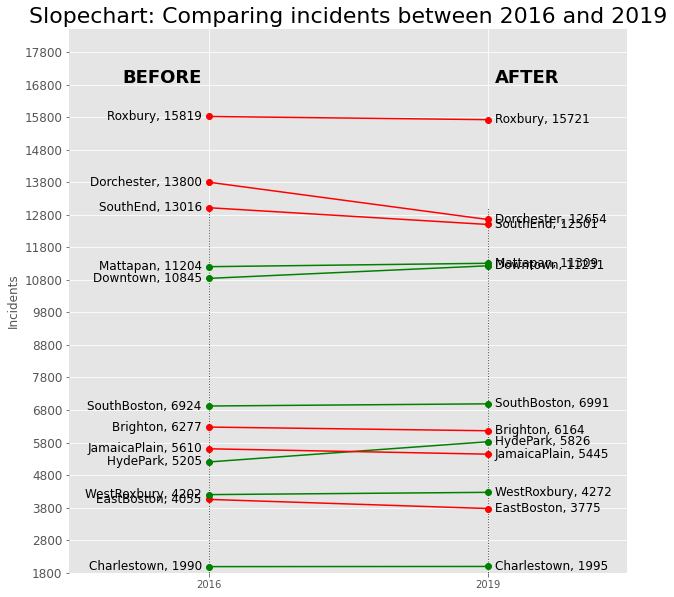

In [14]:
fig, ax = plt.subplots(figsize=(10,10))

# Vertical Lines
ax.vlines(x=1, ymin=500, ymax=13000, color='black', alpha=0.7, linewidth=1, linestyles='dotted')
ax.vlines(x=3, ymin=500, ymax=13000, color='black', alpha=0.7, linewidth=1, linestyles='dotted')

# Points
ax.scatter(y=district_1619[2016], x=district_1619['previous_year'], s=10, color='black', alpha=0.7)
ax.scatter(y=district_1619[2019], x=district_1619['last_year'], s=10, color='black', alpha=0.7)

# Line Segmentsand Annotation
for p1, p2, c in zip(district_1619[2016], district_1619[2019], district_1619.index):
    newline([1,p1], [3,p2])
    ax.text(1-0.05, p1, c + ', ' + str(round(p1)), horizontalalignment='right', verticalalignment='center', fontdict={'size':12})
    ax.text(3+0.05, p2, c + ', ' + str(round(p2)), horizontalalignment='left', verticalalignment='center', fontdict={'size':12})

# 'Before' and 'After' Annotations
ax.text(1-0.05, 17000, 'BEFORE', horizontalalignment='right', verticalalignment='center', fontdict={'size':18, 'weight':700})
ax.text(3+0.05, 17000, 'AFTER', horizontalalignment='left', verticalalignment='center', fontdict={'size':18, 'weight':700})

# Decoration
ax.set_title("Slopechart: Comparing incidents between 2016 and 2019", fontdict={'size':22})
ax.set(xlim=(0,4), ylim=(1800,18500), ylabel='Incidents')
ax.set_xticks([1,3])
ax.set_xticklabels(["2016", "2019"])
plt.yticks(np.arange(1800, 18500, 1000), fontsize=12)

# Lighten borders
plt.gca().spines["top"].set_alpha(.0)
plt.gca().spines["bottom"].set_alpha(.0)
plt.gca().spines["right"].set_alpha(.0)
plt.gca().spines["left"].set_alpha(.0)
plt.show()

In [15]:
# calculate standard score
area_value = df.groupby(['DISTRICT']).size().reset_index(name='Count')
mean = area_value['Count'].mean()
std = area_value['Count'].std()
area_value['standard'] = (area_value['Count'] - mean)/std
area_value['colors'] = ['red' if x < 0 else 'green' for x in area_value['standard']]
area_value.head()

,DISTRICT,Count,standard,colors
0,Brighton,25141,-0.445135,red
1,Charlestown,8215,-1.405436,red
2,Dorchester,53144,1.143622,green
3,Downtown,44410,0.648096,green
4,EastBoston,15725,-0.979354,red


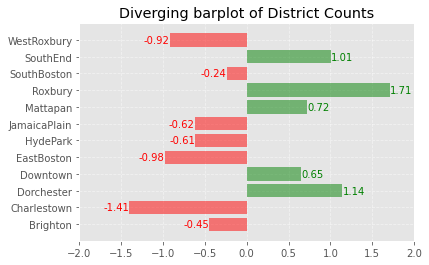

In [16]:
# diverging plot with text 
fig, ax = plt.subplots()
ax.barh(y= area_value.DISTRICT,
       width = area_value.standard,
       color = area_value.colors,
        alpha = 0.5)

for x, y, tex in zip(area_value.standard, area_value.DISTRICT, area_value.standard):
    t = plt.text(x, y, round(tex, 2), horizontalalignment='right' if x < 0 else 'left', 
                 verticalalignment='center', fontdict={'color':'red' if x < 0 else 'green'})

plt.xlim(-2,2)
plt.title('Diverging barplot of District Counts')
plt.grid(linestyle='--', alpha=0.5)
plt.show()

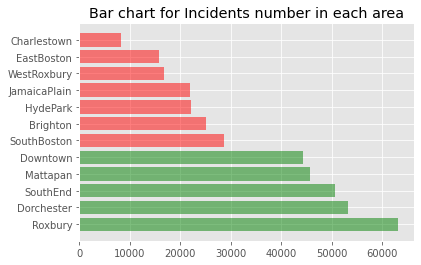

In [17]:
# bar plot 
area_value.sort_values(by = 'standard',ascending=False,inplace = True)

plt.barh(y = area_value.DISTRICT, width= area_value.Count, color = area_value.colors,alpha = 0.5)
plt.title('Bar chart for Incidents number in each area')
plt.show()

In [0]:
# Set Boston lat and long 
latitude = 42.3601
longitude = -71.0589

In [19]:
# Display accident area 
loc = df[['Lat','Long']].dropna()
bos_map = folium.Map(location=[latitude, longitude], zoom_start=12)
# add incidents to map 
HeatMap(loc[['Lat','Long']].values.tolist(),radius=10,min_opacity=0.5,blur=10).add_to(bos_map)
bos_map

In [20]:
pivot_loc = df.pivot_table(values = 'DAY_OF_WEEK',columns='DISTRICT',index='OFFENSE_CODE_GROUP',aggfunc='count')
pivot_loc

DISTRICT,Brighton,Charlestown,Dorchester,Downtown,EastBoston,HydePark,JamaicaPlain,Mattapan,Roxbury,SouthBoston,SouthEnd,WestRoxbury
OFFENSE_CODE_GROUP,,,,,,,,,,,,
Aggravated Assault,362.0,153.0,1224.0,1130.0,350.0,375.0,432.0,1351.0,1968.0,619.0,1020.0,260.0
Aircraft,NaN,NaN,NaN,NaN,54.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
Arson,7.0,3.0,9.0,5.0,3.0,2.0,6.0,12.0,25.0,6.0,12.0,8.0
Assembly or Gathering Violations,66.0,6.0,35.0,231.0,13.0,27.0,11.0,30.0,387.0,29.0,50.0,13.0
Auto Theft,294.0,114.0,844.0,384.0,183.0,248.0,293.0,614.0,917.0,484.0,642.0,184.0
...,...,...,...,...,...,...,...,...,...,...,...,...
Towed,1736.0,414.0,1414.0,1496.0,674.0,411.0,993.0,842.0,1188.0,1591.0,2175.0,371.0
Vandalism,1235.0,408.0,2723.0,1367.0,879.0,886.0,937.0,2175.0,2699.0,1315.0,2019.0,732.0
Verbal Disputes,578.0,209.0,3217.0,266.0,572.0,1259.0,701.0,3571.0,3677.0,665.0,825.0,688.0


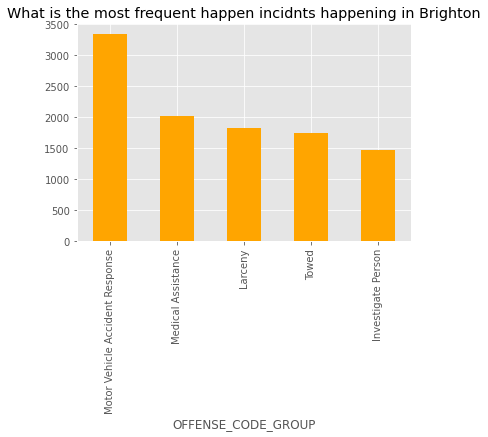

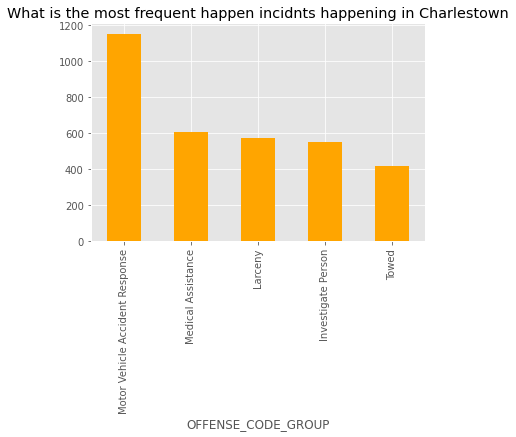

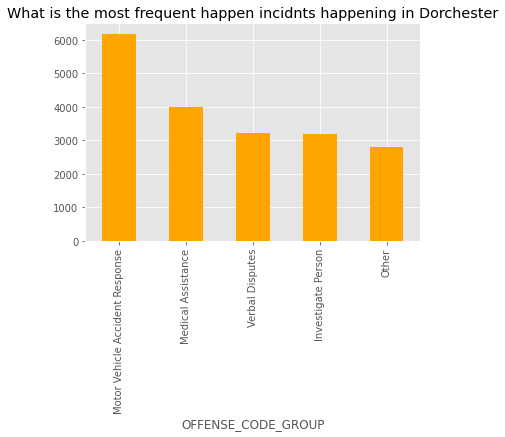

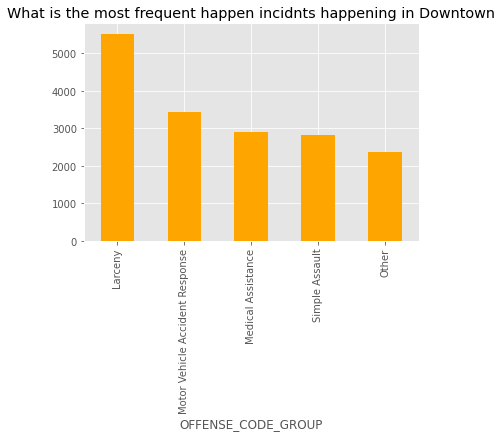

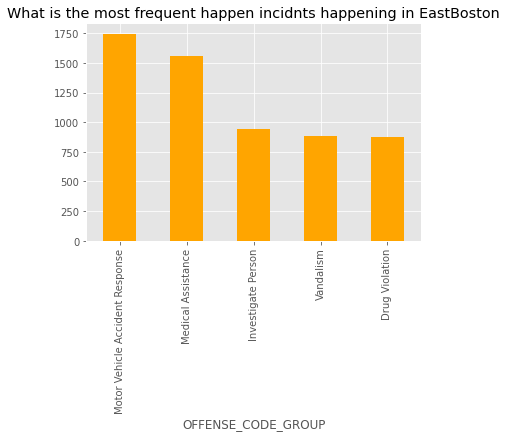

...

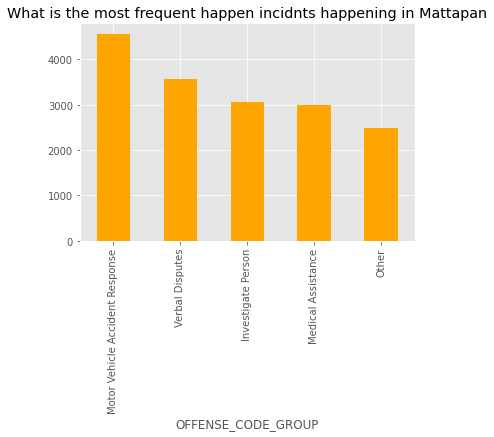

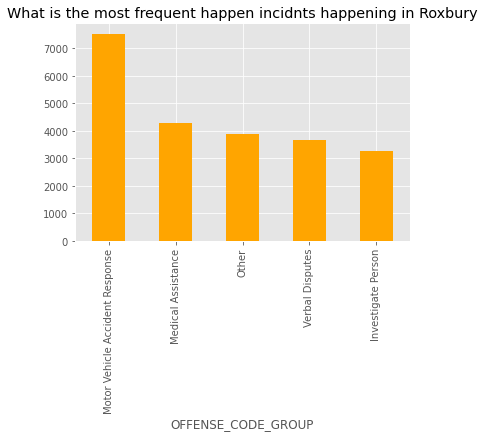

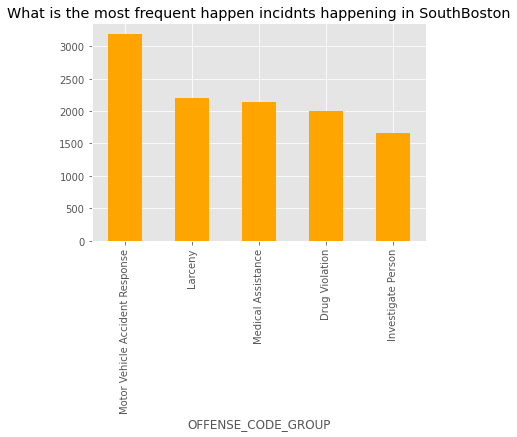

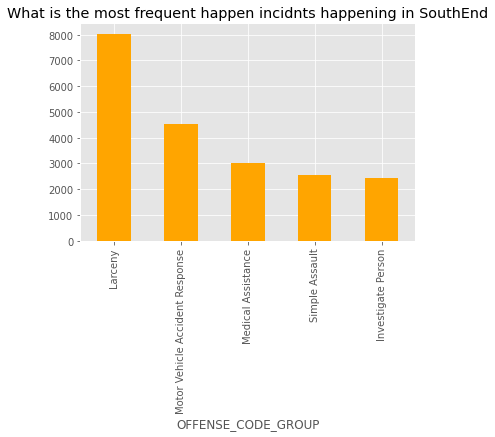

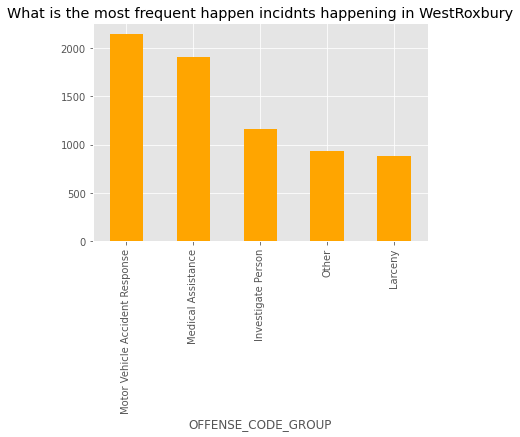

In [21]:
# display most five frequent incidents in each area 
city = pivot_loc.columns.tolist()
for c in city: 
  pivot_loc[c].sort_values(ascending=False).head(5).plot(kind='bar',color='orange')
  plt.title('What is the most frequent happen incidnts happening in '+ c)
  plt.show()

More Often in Roxbury 

**Business Area** : Heavy in larceny 
- South End : Larceny, Motor Vehicle Accident Response, Medical Assistance, Simple Assault, Invesitgate Person 
- DownTown : Larceny, Motor Vehicle Accident Response, Medical Assistance, Simple Assault, Other
- South Boston : Motor Vehicle Acccident Response , Larceny , Medical Assistanve , Drug violation, Investigate Person 

**Bad Transportation Area**: Towed 
- Charles Town :  Motor Vehicle Accident Response , Medical Assistance, Larceny, Investigate Person , Towed(拖车）
- Brighton： Motor Vehicle Accident Response , Medical Assistance, Larceny, Towed(拖车，Investigate Person 

**Drug Issue Area**
- Jamaica Plain : Motor Vehicle Accident Response , Medical Assistance, Larceny, Drug Violation , Other 

**Historical Area**
- East Boston : Motor Vehicle Accident Response , Medical Assistance, Investigate Person ,Vandalism(破坏文物）, Drug Violation 

**Residents Area**: Verbal Disputes 
- Mattapan : Motor Vehicle Accident Response , Verbal Disputes, Investigate Person , Medical Assistance , Other 
- Dorchester : Motor Vehicle Accident Response , Medical Assistance, Verbal Disputes , Investigate Person , Other 
- Hyde Park: Motor Vehicle Accident Response , Medical Assistance, Investigate Person , Investigate property, Verbal Disputes 
- West Roxbury  : Motor Vehicle Accident Response , Medical Assistance , Investigate Person, Other , Larceny
- Roxbury : Motor Vehicle Accident Response , Medical Assistance , Other , Verbal Disputes, Investigate Person 


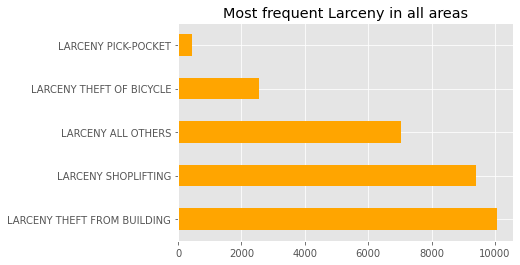

In [22]:
# Most Larceny are shoplifting and theft from building 
df[df.OFFENSE_CODE_GROUP == 'Larceny'].groupby('OFFENSE_DESCRIPTION')['OFFENSE_CODE'].count().sort_values(ascending = False).head(5).plot(kind='barh',color='orange')
plt.ylabel('')
plt.title('Most frequent Larceny in all areas')
plt.show()

In [23]:
# vandalism 

vandalism_location = df[df.OFFENSE_DESCRIPTION == 'VANDALISM'][['Lat','Long']].dropna()

# Create map and display it
bos_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# add incidents to map 
HeatMap(vandalism_location[['Lat','Long']].values.tolist(),radius=10,min_opacity=0.5,blur=10).add_to(bos_map)
bos_map

In [24]:
# shoplifting 
Larceny_location = df[df.OFFENSE_DESCRIPTION == 'LARCENY SHOPLIFTING'][['Lat','Long']].dropna()

# Create map and display it
bos_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# add incidents to map 
HeatMap(Larceny_location[['Lat','Long']].values.tolist(),radius=10,min_opacity=0.5,blur=10).add_to(bos_map)
bos_map

In [25]:
# drug violation location 
drugviolation = df[df['OFFENSE_CODE_GROUP']=='Drug Violation']
drugviolation = drugviolation[['Lat','Long']].dropna()

# Create map and display it
bos_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# add incidents to map 
HeatMap(drugviolation[['Lat','Long']].values.tolist(),radius=10,min_opacity=0.5,blur=10).add_to(bos_map)

bos_map

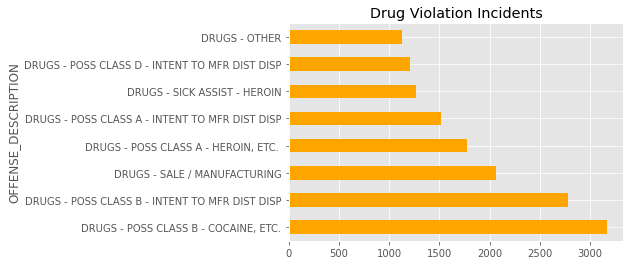

In [26]:
# specific drug violation 
df[df['OFFENSE_CODE_GROUP']=='Drug Violation'].groupby('OFFENSE_DESCRIPTION')['OFFENSE_CODE'].count().sort_values(ascending=False).head(8).plot(kind='barh',color='orange')
plt.title('Drug Violation Incidents')
plt.show()

In [27]:
# towed distribution 

Towed = df[df['OFFENSE_CODE_GROUP']=='Towed']
Towed = Towed[['Lat','Long']].dropna()
# Create map and display it
bos_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# add incidents to map 
HeatMap(Towed[['Lat','Long']].values.tolist(),radius=10,min_opacity=0.5,blur=10).add_to(bos_map)

bos_map

In [28]:
# verbal disputes 
vd = df[df['OFFENSE_CODE_GROUP']=='Verbal Disputes']
vd = vd[['Lat','Long']].dropna()

# Create map and display it
bos_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# add incidents to map 
HeatMap(vd[['Lat','Long']].values.tolist(),radius=10,min_opacity=0.5,blur=10).add_to(bos_map)

bos_map

# Incidents
不同地区某一类事件的时间分布

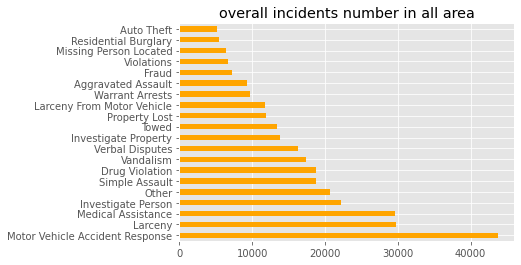

In [29]:
#overall incidents number in all area 
df['OFFENSE_CODE_GROUP'].value_counts().head(20).plot(kind='barh',color='orange')
plt.title('overall incidents number in all area')
plt.show()

In [30]:
# offense in time and district 
pivot_time = df.pivot_table(values = 'DAY_OF_WEEK',columns='DISTRICT',index=['OFFENSE_CODE_GROUP','OCCURRED_ON_DATE'],aggfunc='count',fill_value=0)
pivot_time

DISTRICT                             Brighton  ...  WestRoxbury
OFFENSE_CODE_GROUP OCCURRED_ON_DATE            ...             
Aggravated Assault 2016-01-01               0  ...            2
                   2016-01-02               0  ...            0
                   2016-01-03               0  ...            0
                   2016-01-05               0  ...            0
                   2016-01-06               0  ...            0
...                                       ...  ...          ...
Warrant Arrests    2019-09-29               0  ...            0
                   2016-01-04               0  ...            0
                   2016-12-29               0  ...            0
                   2018-03-21               1  ...            0
                   2018-11-26               0  ...            0

[51784 rows x 12 columns]

<Figure size 7200x6000 with 0 Axes>

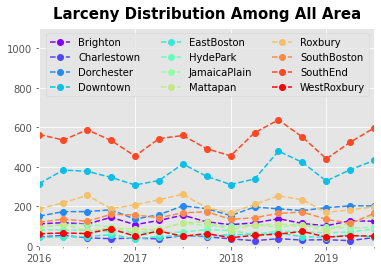

In [31]:
# Larceny Time 
Larceny = pivot_time.loc['Larceny']
Larceny.index = pd.to_datetime(Larceny.index)
plt.figure(figsize=(12,10),dpi = 600)
Larceny.resample('Q').sum().plot(marker='o',linestyle='--',cmap = 'rainbow',linewidth=1.5)
plt.title('Larceny Distribution Among All Area',fontdict={'fontsize':15,'fontweight':'bold'},loc='center',pad = 10)
plt.xlabel('')
plt.ylim(0,1100)
plt.legend(ncol=3)
plt.show()

<Figure size 7200x6000 with 0 Axes>

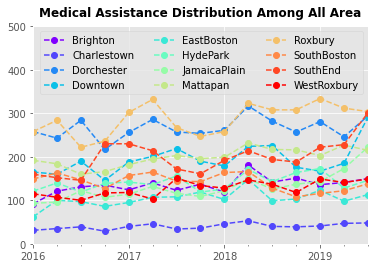

In [32]:
# Medical Assistance 
MA = pivot_time.loc['Medical Assistance']
MA.index = pd.to_datetime(MA.index)
plt.figure(figsize=(12,10),dpi = 600)
MA.resample('Q').sum().plot(marker='o',linestyle='--',cmap = 'rainbow',linewidth=1.5)
plt.title('Medical Assistance Distribution Among All Area',fontdict={'fontsize':12,'fontweight':'bold'},loc='center',pad = 10)
plt.xlabel('')
plt.ylim(0,500)
plt.legend(ncol=3)
plt.show()

<Figure size 7200x6000 with 0 Axes>

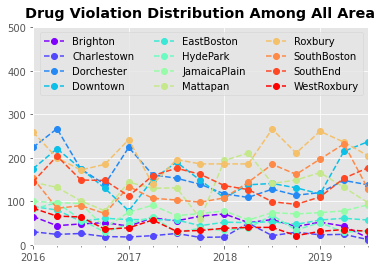

In [33]:
# DV Time 
DV = pivot_time.loc['Drug Violation']
DV.index = pd.to_datetime(DV.index)
plt.figure(figsize=(12,10),dpi = 600)
DV = DV.resample('Q').sum().plot(marker='o',linestyle='--',cmap = 'rainbow',linewidth=1.5)
plt.title('Drug Violation Distribution Among All Area',fontdict={'fontweight':'bold'},loc='center',pad=10)
plt.ylim(0,500)
plt.xlabel('')
plt.legend(ncol=3)
plt.show()

<Figure size 7200x6000 with 0 Axes>

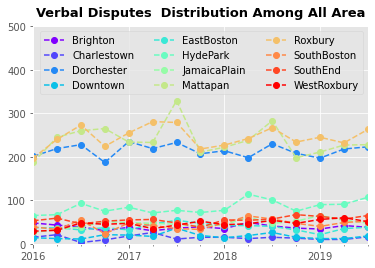

In [34]:
# DV Time 
VD = pivot_time.loc['Verbal Disputes']
VD.index = pd.to_datetime(VD.index)
plt.figure(figsize=(12,10),dpi = 600)
VD = VD.resample('Q').sum().plot(marker='o',linestyle='--',cmap = 'rainbow',linewidth=1.5)
plt.title('Verbal Disputes  Distribution Among All Area',fontdict={'fontsize':13,'fontweight':'bold'},loc='center',pad=10)
plt.ylim(0,500)
plt.xlabel('')
plt.legend(ncol=3)
plt.show()

<Figure size 7200x6000 with 0 Axes>

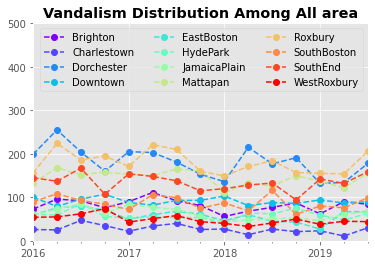

In [35]:
# Vandalism 
V = pivot_time.loc['Vandalism']
V.index = pd.to_datetime(V.index)
plt.figure(figsize=(12,10),dpi = 600)
V.resample('Q').sum().plot(marker='o',linestyle='--',cmap = 'rainbow',linewidth=1.5)
plt.title('Vandalism Distribution Among All area',fontdict={'fontweight':'bold'},loc='center')
plt.ylim(0,500)
plt.xlabel('')
plt.legend(ncol=3)
plt.show()

<Figure size 7200x6000 with 0 Axes>

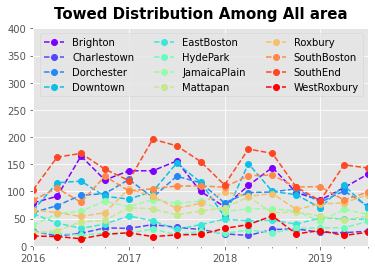

In [36]:
# Towed
T = pivot_time.loc['Towed']
T.index = pd.to_datetime(T.index)
plt.figure(figsize=(12,10),dpi = 600)
T.resample('Q').sum().plot(marker='o',linestyle='--',cmap = 'rainbow',linewidth=1.5)
plt.title('Towed Distribution Among All area',fontdict={'fontsize':15,'fontweight':'bold'},loc='center',pad=10)
plt.ylim(0,400)
plt.xlabel('')
plt.legend(ncol=3)
plt.show()

<Figure size 7200x6000 with 0 Axes>

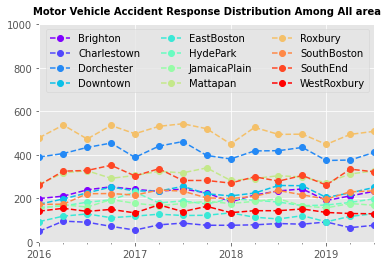

In [37]:
# Motor Vichhle 
MV = pivot_time.loc['Motor Vehicle Accident Response']
MV.index = pd.to_datetime(MV.index)
plt.figure(figsize=(12,10),dpi = 600)
MV.resample('Q').sum().plot(marker='o',linestyle='--',cmap = 'rainbow',linewidth=1.5)
plt.title('Motor Vehicle Accident Response Distribution Among All area',fontdict={'fontsize':10,'fontweight':'bold'},loc='center',pad=10)
plt.ylim(0,1000)
plt.xlabel('')
plt.legend(ncol=3)
plt.show()

In [38]:
# personal injury location distribution 
personal_inj = df[df.OFFENSE_DESCRIPTION=='M/V ACCIDENT - PERSONAL INJURY'][['Lat','Long']].dropna()
some_map = folium.Map(location=[latitude,longitude], 
                      zoom_start=12)
mc = MarkerCluster()
#creating a Marker for each point in df_sample. Each point will get a popup with their zip
for row in personal_inj.itertuples():
    mc.add_child(folium.Marker(location=[row.Lat,row.Long]))
 
some_map.add_child(mc)
some_map